<a href="https://colab.research.google.com/github/nnkurhade/Coursera_Capstone/blob/master/Applied_Data_Science_Coursera_Capstone_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Coursera Capstone Project

## Searching for right neighborhoods in Toronto to open a new restaurent

In [2]:
import urllib.request
import pandas as pd
import numpy as np

In [3]:
url = 'https://en.wikipedia.org/wiki/List_of_postal_codes_of_Canada:_M'

In [4]:
page = urllib.request.urlopen(url)

In [5]:
from bs4 import BeautifulSoup

In [6]:
soup = BeautifulSoup(page, "lxml")

In [7]:
print(soup.prettify())

<!DOCTYPE html>
<html class="client-nojs" dir="ltr" lang="en">
 <head>
  <meta charset="utf-8"/>
  <title>
   List of postal codes of Canada: M - Wikipedia
  </title>
  <script>
   document.documentElement.className="client-js";RLCONF={"wgBreakFrames":!1,"wgSeparatorTransformTable":["",""],"wgDigitTransformTable":["",""],"wgDefaultDateFormat":"dmy","wgMonthNames":["","January","February","March","April","May","June","July","August","September","October","November","December"],"wgRequestId":"dfa30709-0818-4d46-b602-8d89a60b3027","wgCSPNonce":!1,"wgCanonicalNamespace":"","wgCanonicalSpecialPageName":!1,"wgNamespaceNumber":0,"wgPageName":"List_of_postal_codes_of_Canada:_M","wgTitle":"List of postal codes of Canada: M","wgCurRevisionId":969510799,"wgRevisionId":969510799,"wgArticleId":539066,"wgIsArticle":!0,"wgIsRedirect":!1,"wgAction":"view","wgUserName":null,"wgUserGroups":["*"],"wgCategories":["Articles with short description","Short description is different from Wikidata","Communicati

In [8]:
all_tables = soup.find_all("table")
all_tables

[<table class="wikitable sortable">
 <tbody><tr>
 <th>Postal Code
 </th>
 <th>Borough
 </th>
 <th>Neighbourhood
 </th></tr>
 <tr>
 <td>M1A
 </td>
 <td>Not assigned
 </td>
 <td>Not assigned
 </td></tr>
 <tr>
 <td>M2A
 </td>
 <td>Not assigned
 </td>
 <td>Not assigned
 </td></tr>
 <tr>
 <td>M3A
 </td>
 <td>North York
 </td>
 <td>Parkwoods
 </td></tr>
 <tr>
 <td>M4A
 </td>
 <td>North York
 </td>
 <td>Victoria Village
 </td></tr>
 <tr>
 <td>M5A
 </td>
 <td>Downtown Toronto
 </td>
 <td>Regent Park, Harbourfront
 </td></tr>
 <tr>
 <td>M6A
 </td>
 <td>North York
 </td>
 <td>Lawrence Manor, Lawrence Heights
 </td></tr>
 <tr>
 <td>M7A
 </td>
 <td>Downtown Toronto
 </td>
 <td>Queen's Park, Ontario Provincial Government
 </td></tr>
 <tr>
 <td>M8A
 </td>
 <td>Not assigned
 </td>
 <td>Not assigned
 </td></tr>
 <tr>
 <td>M9A
 </td>
 <td>Etobicoke
 </td>
 <td>Islington Avenue, Humber Valley Village
 </td></tr>
 <tr>
 <td>M1B
 </td>
 <td>Scarborough
 </td>
 <td>Malvern, Rouge
 </td></tr>
 <tr>
 <td>M2B

In [9]:
right_table = soup.find('table', class_ = 'wikitable sortable')
right_table

<table class="wikitable sortable">
<tbody><tr>
<th>Postal Code
</th>
<th>Borough
</th>
<th>Neighbourhood
</th></tr>
<tr>
<td>M1A
</td>
<td>Not assigned
</td>
<td>Not assigned
</td></tr>
<tr>
<td>M2A
</td>
<td>Not assigned
</td>
<td>Not assigned
</td></tr>
<tr>
<td>M3A
</td>
<td>North York
</td>
<td>Parkwoods
</td></tr>
<tr>
<td>M4A
</td>
<td>North York
</td>
<td>Victoria Village
</td></tr>
<tr>
<td>M5A
</td>
<td>Downtown Toronto
</td>
<td>Regent Park, Harbourfront
</td></tr>
<tr>
<td>M6A
</td>
<td>North York
</td>
<td>Lawrence Manor, Lawrence Heights
</td></tr>
<tr>
<td>M7A
</td>
<td>Downtown Toronto
</td>
<td>Queen's Park, Ontario Provincial Government
</td></tr>
<tr>
<td>M8A
</td>
<td>Not assigned
</td>
<td>Not assigned
</td></tr>
<tr>
<td>M9A
</td>
<td>Etobicoke
</td>
<td>Islington Avenue, Humber Valley Village
</td></tr>
<tr>
<td>M1B
</td>
<td>Scarborough
</td>
<td>Malvern, Rouge
</td></tr>
<tr>
<td>M2B
</td>
<td>Not assigned
</td>
<td>Not assigned
</td></tr>
<tr>
<td>M3B
</td>
<td

In [10]:
A=[]
B=[]
C=[]
for row in right_table.findAll('tr'):
    cells = row.findAll('td')
    if len(cells)==3:
        A.append(cells[0].find(text = True))
        B.append(cells[1].find(text = True))
        C.append(cells[2].find(text = True))

In [11]:
df = pd.DataFrame(A,columns =['postal_code'])
df['borough'] = B
df['neighborhood'] = C
df.head()

,postal_code,borough,neighborhood
0,M1A\n,Not assigned\n,Not assigned\n
1,M2A\n,Not assigned\n,Not assigned\n
2,M3A\n,North York\n,Parkwoods\n
3,M4A\n,North York\n,Victoria Village\n
4,M5A\n,Downtown Toronto\n,"Regent Park, Harbourfront\n"


In [12]:
df.drop(df[df['borough']=='Not assigned\n'].index,inplace = True)
df.head()

,postal_code,borough,neighborhood
2,M3A\n,North York\n,Parkwoods\n
3,M4A\n,North York\n,Victoria Village\n
4,M5A\n,Downtown Toronto\n,"Regent Park, Harbourfront\n"
5,M6A\n,North York\n,"Lawrence Manor, Lawrence Heights\n"
6,M7A\n,Downtown Toronto\n,"Queen's Park, Ontario Provincial Government\n"


In [13]:
df.shape

(103, 3)

In [14]:
df['lat'] = None
df['lon'] = None
df.head()

,postal_code,borough,neighborhood,lat,lon
2,M3A\n,North York\n,Parkwoods\n,None,None
3,M4A\n,North York\n,Victoria Village\n,None,None
4,M5A\n,Downtown Toronto\n,"Regent Park, Harbourfront\n",None,None
5,M6A\n,North York\n,"Lawrence Manor, Lawrence Heights\n",None,None
6,M7A\n,Downtown Toronto\n,"Queen's Park, Ontario Provincial Government\n",None,None


In [15]:
df.index = range(0,103)
df.head()

,postal_code,borough,neighborhood,lat,lon
0,M3A\n,North York\n,Parkwoods\n,None,None
1,M4A\n,North York\n,Victoria Village\n,None,None
2,M5A\n,Downtown Toronto\n,"Regent Park, Harbourfront\n",None,None
3,M6A\n,North York\n,"Lawrence Manor, Lawrence Heights\n",None,None
4,M7A\n,Downtown Toronto\n,"Queen's Park, Ontario Provincial Government\n",None,None


In [16]:
url2 = 'https://cocl.us/Geospatial_data'
df2 = pd.read_csv(url2)
df2.head()

,Postal Code,Latitude,Longitude
0,M1B,43.806686,-79.194353
1,M1C,43.784535,-79.160497
2,M1E,43.763573,-79.188711
3,M1G,43.770992,-79.216917
4,M1H,43.773136,-79.239476


In [17]:
df2.shape

(103, 3)

In [18]:
df2.sort_values(by = ['Postal Code'],ascending = True, inplace = True)
df2.head()

,Postal Code,Latitude,Longitude
0,M1B,43.806686,-79.194353
1,M1C,43.784535,-79.160497
2,M1E,43.763573,-79.188711
3,M1G,43.770992,-79.216917
4,M1H,43.773136,-79.239476


In [19]:
df3 = df.sort_values(by = ['postal_code'],ascending = True, inplace = False)
df3.head()

,postal_code,borough,neighborhood,lat,lon
6,M1B\n,Scarborough\n,"Malvern, Rouge\n",None,None
12,M1C\n,Scarborough\n,"Rouge Hill, Port Union, Highland Creek\n",None,None
18,M1E\n,Scarborough\n,"Guildwood, Morningside, West Hill\n",None,None
22,M1G\n,Scarborough\n,Woburn\n,None,None
26,M1H\n,Scarborough\n,Cedarbrae\n,None,None


In [20]:
df3.index = range(0,103)
df3.head()

,postal_code,borough,neighborhood,lat,lon
0,M1B\n,Scarborough\n,"Malvern, Rouge\n",None,None
1,M1C\n,Scarborough\n,"Rouge Hill, Port Union, Highland Creek\n",None,None
2,M1E\n,Scarborough\n,"Guildwood, Morningside, West Hill\n",None,None
3,M1G\n,Scarborough\n,Woburn\n,None,None
4,M1H\n,Scarborough\n,Cedarbrae\n,None,None


In [21]:
df3[['lat','lon']] = df2[['Latitude','Longitude']]
df3.head()

,postal_code,borough,neighborhood,lat,lon
0,M1B\n,Scarborough\n,"Malvern, Rouge\n",43.806686,-79.194353
1,M1C\n,Scarborough\n,"Rouge Hill, Port Union, Highland Creek\n",43.784535,-79.160497
2,M1E\n,Scarborough\n,"Guildwood, Morningside, West Hill\n",43.763573,-79.188711
3,M1G\n,Scarborough\n,Woburn\n,43.770992,-79.216917
4,M1H\n,Scarborough\n,Cedarbrae\n,43.773136,-79.239476


In [22]:
!pip install folium
#!conda install -c conda-forge folium=0.5.0 --yes # uncomment this line if you haven't completed the Foursquare API lab
import folium # map rendering library
print('folium imported')

folium imported


In [23]:
import numpy as np # library to handle data in a vectorized manner

import pandas as pd # library for data analsysis
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

import json # library to handle JSON files

!pip install geopy
#!conda install -c conda-forge geopy --yes # uncomment this line if you haven't completed the Foursquare API lab
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors

# import k-means from clustering stage
from sklearn.cluster import KMeans

#!conda install -c conda-forge folium=0.5.0 --yes # uncomment this line if you haven't completed the Foursquare API lab
import folium # map rendering library

print('Libraries imported.')

Libraries imported.


In [24]:
df_toronto = df3.copy()
df_toronto.head()

,postal_code,borough,neighborhood,lat,lon
0,M1B\n,Scarborough\n,"Malvern, Rouge\n",43.806686,-79.194353
1,M1C\n,Scarborough\n,"Rouge Hill, Port Union, Highland Creek\n",43.784535,-79.160497
2,M1E\n,Scarborough\n,"Guildwood, Morningside, West Hill\n",43.763573,-79.188711
3,M1G\n,Scarborough\n,Woburn\n,43.770992,-79.216917
4,M1H\n,Scarborough\n,Cedarbrae\n,43.773136,-79.239476


In [25]:
df_toronto.shape

(103, 5)

In [26]:
df_toronto

,postal_code,borough,neighborhood,lat,lon
0,M1B\n,Scarborough\n,"Malvern, Rouge\n",43.806686,-79.194353
1,M1C\n,Scarborough\n,"Rouge Hill, Port Union, Highland Creek\n",43.784535,-79.160497
2,M1E\n,Scarborough\n,"Guildwood, Morningside, West Hill\n",43.763573,-79.188711
3,M1G\n,Scarborough\n,Woburn\n,43.770992,-79.216917
4,M1H\n,Scarborough\n,Cedarbrae\n,43.773136,-79.239476
5,M1J\n,Scarborough\n,Scarborough Village\n,43.744734,-79.239476
6,M1K\n,Scarborough\n,"Kennedy Park, Ionview, East Birchmount Park\n",43.727929,-79.262029
7,M1L\n,Scarborough\n,"Golden Mile, Clairlea, Oakridge\n",43.711112,-79.284577
8,M1M\n,Scarborough\n,"Cliffside, Cliffcrest, Scarborough Village West\n",43.716316,-79.239476
9,M1N\n,Scarborough\n,"Birch Cliff, Cliffside West\n",43.692657,-79.264848


In [27]:
df_toronto.neighborhood

0                                       Malvern, Rouge\n
1               Rouge Hill, Port Union, Highland Creek\n
2                    Guildwood, Morningside, West Hill\n
3                                               Woburn\n
4                                            Cedarbrae\n
5                                  Scarborough Village\n
6          Kennedy Park, Ionview, East Birchmount Park\n
7                      Golden Mile, Clairlea, Oakridge\n
8      Cliffside, Cliffcrest, Scarborough Village West\n
9                          Birch Cliff, Cliffside West\n
10     Dorset Park, Wexford Heights, Scarborough Town...
11                                   Wexford, Maryvale\n
12                                           Agincourt\n
13             Clarks Corners, Tam O'Shanter, Sullivan\n
14     Milliken, Agincourt North, Steeles East, L'Amo...
15                       Steeles West, L'Amoreaux West\n
16                                         Upper Rouge\n
17                             

In [28]:
df_toronto.index = range(0,df_toronto.shape[0])

In [29]:
address = 'Toronto'

geolocator = Nominatim(user_agent="t_explorer")
location = geolocator.geocode(address)
latitude_t = location.latitude
longitude_t = location.longitude
print('The geograpical coordinate of Toronto are {}, {}.'.format(latitude_t, longitude_t))

The geograpical coordinate of Toronto are 43.6534817, -79.3839347.


In [30]:
# create map of Toronto using latitude and longitude values
map_toronto = folium.Map(location=[latitude_t, longitude_t], zoom_start=10)

# add markers to map
for lat, lon, borough, neighborhood in zip(df_toronto['lat'], df_toronto['lon'], df_toronto['borough'], df_toronto['neighborhood']):
    label = '{}, {}'.format(neighborhood, borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_toronto)  
    
map_toronto

In [31]:
CLIENT_ID = 'NYEW35WW1IEBJFIFVTC42AMY55BC1M323ASF0FCL0RUCYJYX' # your Foursquare ID
CLIENT_SECRET = 'WBSZHJWYEWE2XXZKLRANV4NY10PSBK0LP544Z02FPESSVNV1' # your Foursquare Secret
VERSION = '20180605' # Foursquare API version

print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Your credentails:
CLIENT_ID: NYEW35WW1IEBJFIFVTC42AMY55BC1M323ASF0FCL0RUCYJYX
CLIENT_SECRET:WBSZHJWYEWE2XXZKLRANV4NY10PSBK0LP544Z02FPESSVNV1


In [32]:
LIMIT = 100
radius = 500

In [33]:
def getNearbyVenues(names, latitudes, longitudes, radius=500):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [34]:
toronto_venues = getNearbyVenues(names=df_toronto['neighborhood'],
                                   latitudes=df_toronto['lat'],
                                   longitudes=df_toronto['lon']
                                  )

Malvern, Rouge

Rouge Hill, Port Union, Highland Creek

Guildwood, Morningside, West Hill

Woburn

Cedarbrae

Scarborough Village

Kennedy Park, Ionview, East Birchmount Park

Golden Mile, Clairlea, Oakridge

Cliffside, Cliffcrest, Scarborough Village West

Birch Cliff, Cliffside West

Dorset Park, Wexford Heights, Scarborough Town Centre

Wexford, Maryvale

Agincourt

Clarks Corners, Tam O'Shanter, Sullivan

Milliken, Agincourt North, Steeles East, L'Amoreaux East

Steeles West, L'Amoreaux West

Upper Rouge

Hillcrest Village

Fairview, Henry Farm, Oriole

Bayview Village

York Mills, Silver Hills

Willowdale, Newtonbrook

Willowdale, Willowdale East

York Mills West

Willowdale, Willowdale West

Parkwoods

Don Mills

Don Mills

Bathurst Manor, Wilson Heights, Downsview North

Northwood Park, York University

Downsview

Downsview

Downsview

Downsview

Victoria Village

Parkview Hill, Woodbine Gardens

Woodbine Heights

The Beaches

Leaside

Thorncliffe Park

East Toronto, Broadview N

In [35]:
print(toronto_venues.shape)
toronto_venues.head()

(2153, 7)


,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,"Malvern, Rouge\n",43.806686,-79.194353,Wendy’s,43.807448,-79.199056,Fast Food Restaurant
1,"Rouge Hill, Port Union, Highland Creek\n",43.784535,-79.160497,Great Shine Window Cleaning,43.783145,-79.157431,Home Service
2,"Rouge Hill, Port Union, Highland Creek\n",43.784535,-79.160497,Royal Canadian Legion,43.782533,-79.163085,Bar
3,"Guildwood, Morningside, West Hill\n",43.763573,-79.188711,RBC Royal Bank,43.766790,-79.191151,Bank
4,"Guildwood, Morningside, West Hill\n",43.763573,-79.188711,G & G Electronics,43.765309,-79.191537,Electronics Store


In [36]:
toronto_venues.groupby('Neighborhood').count()

,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
Neighborhood,,,,,,
Agincourt\n,4,4,4,4,4,4
"Alderwood, Long Branch\n",7,7,7,7,7,7
"Bathurst Manor, Wilson Heights, Downsview North\n",24,24,24,24,24,24
Bayview Village\n,4,4,4,4,4,4
"Bedford Park, Lawrence Manor East\n",24,24,24,24,24,24
Berczy Park\n,57,57,57,57,57,57
"Birch Cliff, Cliffside West\n",4,4,4,4,4,4
"Brockton, Parkdale Village, Exhibition Place\n",24,24,24,24,24,24
"Business reply mail Processing Centre, South Central Letter Processing Plant Toronto\n",18,18,18,18,18,18


In [37]:
print('There are {} uniques categories.'.format(len(toronto_venues['Venue Category'].unique())))

There are 268 uniques categories.


In [38]:
# one hot encoding
toronto_onehot = pd.get_dummies(toronto_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
toronto_onehot['Neighborhood'] = toronto_venues['Neighborhood'] 

# move neighborhood column to the first column
fixed_columns = [toronto_onehot.columns[-1]] + list(toronto_onehot.columns[:-1])
toronto_onehot = toronto_onehot[fixed_columns]

toronto_onehot.head()

,Yoga Studio,Accessories Store,Airport,Airport Food Court,Airport Gate,Airport Lounge,Airport Service,Airport Terminal,American Restaurant,Antique Shop,Aquarium,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Auto Garage,Auto Workshop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Stadium,Beach,Bed & Breakfast,Beer Bar,Beer Store,Belgian Restaurant,Bike Shop,Bistro,Board Shop,Boat or Ferry,Bookstore,Boutique,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bubble Tea Shop,Building,Burger Joint,Burrito Place,Bus Line,Bus Station,Butcher,Café,Cajun / Creole Restaurant,Camera Store,Candy Store,Caribbean Restaurant,Carpet Store,Cheese Shop,Chinese Restaurant,Chocolate Shop,Church,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,College Arts Building,College Auditorium,College Gym,College Rec Center,College Stadium,Colombian Restaurant,Comfort Food Restaurant,Comic Shop,Concert Hall,Construction & Landscaping,Convenience Store,Cosmetics Shop,Coworking Space,Creperie,Cuban Restaurant,Cupcake Shop,Curling Ice,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Distribution Center,Dog Run,Doner Restaurant,Donut Shop,Drugstore,Dumpling Restaurant,Eastern European Restaurant,Electronics Store,Ethiopian Restaurant,Event Space,Falafel Restaurant,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food & Drink Shop,Food Court,Food Truck,Fountain,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,General Travel,German Restaurant,Gift Shop,Gluten-free Restaurant,Golf Course,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Hakka Restaurant,Harbor / Marina,Hardware Store,Health & Beauty Service,Health Food Store,Historic Site,History Museum,Hobby Shop,Hockey Arena,Home Service,Hospital,Hostel,Hotel,Hotel Bar,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indonesian Restaurant,Indoor Play Area,Insurance Office,Intersection,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Korean Restaurant,Lake,Latin American Restaurant,Light Rail Station,Lingerie Store,Liquor Store,Locksmith,Lounge,Luggage Store,Malay Restaurant,Market,Martial Arts School,Massage Studio,Medical Center,Mediterranean Restaurant,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Molecular Gastronomy Restaurant,Monument / Landmark,Moroccan Restaurant,Motel,Movie Theater,Museum,Music Venue,Neighborhood,New American Restaurant,Nightclub,Noodle House,Office,Opera House,Optical Shop,Organic Grocery,Other Great Outdoors,Other Repair Shop,Park,Performing Arts Venue,Persian Restaurant,Pet Store,Pharmacy,Pizza Place,Plane,Playground,Plaza,Poke Place,Pool,Portuguese Restaurant,Post Office,Poutine Place,Pub,Ramen Restaurant,Record Shop,Rental Car Location,Restaurant,River,Roof Deck,Sake Bar,Salad Place,Salon / Barbershop,Sandwich Place,Scenic Lookout,Sculpture Garden,Seafood Restaurant,Shoe Store,Shopping Mall,Skate Park,Skating Rink,Smoke Shop,Smoothie Shop,Snack Place,Soccer Field,Social Club,Soup Place,Spa,Speakeasy,Sporting Goods Shop,Sports Bar,Stadium,Stationery Store,Steakhouse,Strip Club,Supermarket,Supplement Shop,Sushi Restaurant,Swim School,Taco Place,Tailor Shop,Taiwanese Restaurant,Tanning Salon,Tea Room,Tennis Court,Thai Restaurant,Theater,Theme Restaurant,Toy / Game Store,Trail,Train Station,Vegetarian / Vegan Restaurant,Video Game Store,Vietnamese Restaurant,Warehouse Store,Wine Bar,Wings Joint,Women's Store
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0

In [39]:
toronto_onehot.shape

(2153, 268)

In [40]:
toronto_grouped = toronto_onehot.groupby('Neighborhood').mean().reset_index()
toronto_grouped

,Neighborhood,Yoga Studio,Accessories Store,Airport,Airport Food Court,Airport Gate,Airport Lounge,Airport Service,Airport Terminal,American Restaurant,Antique Shop,Aquarium,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Auto Garage,Auto Workshop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Stadium,Beach,Bed & Breakfast,Beer Bar,Beer Store,Belgian Restaurant,Bike Shop,Bistro,Board Shop,Boat or Ferry,Bookstore,Boutique,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bubble Tea Shop,Building,Burger Joint,Burrito Place,Bus Line,Bus Station,Butcher,Café,Cajun / Creole Restaurant,Camera Store,Candy Store,Caribbean Restaurant,Carpet Store,Cheese Shop,Chinese Restaurant,Chocolate Shop,Church,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,College Arts Building,College Auditorium,College Gym,College Rec Center,College Stadium,Colombian Restaurant,Comfort Food Restaurant,Comic Shop,Concert Hall,Construction & Landscaping,Convenience Store,Cosmetics Shop,Coworking Space,Creperie,Cuban Restaurant,Cupcake Shop,Curling Ice,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Distribution Center,Dog Run,Doner Restaurant,Donut Shop,Drugstore,Dumpling Restaurant,Eastern European Restaurant,Electronics Store,Ethiopian Restaurant,Event Space,Falafel Restaurant,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food & Drink Shop,Food Court,Food Truck,Fountain,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,General Travel,German Restaurant,Gift Shop,Gluten-free Restaurant,Golf Course,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Hakka Restaurant,Harbor / Marina,Hardware Store,Health & Beauty Service,Health Food Store,Historic Site,History Museum,Hobby Shop,Hockey Arena,Home Service,Hospital,Hostel,Hotel,Hotel Bar,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indonesian Restaurant,Indoor Play Area,Insurance Office,Intersection,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Korean Restaurant,Lake,Latin American Restaurant,Light Rail Station,Lingerie Store,Liquor Store,Locksmith,Lounge,Luggage Store,Malay Restaurant,Market,Martial Arts School,Massage Studio,Medical Center,Mediterranean Restaurant,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Molecular Gastronomy Restaurant,Monument / Landmark,Moroccan Restaurant,Motel,Movie Theater,Museum,Music Venue,New American Restaurant,Nightclub,Noodle House,Office,Opera House,Optical Shop,Organic Grocery,Other Great Outdoors,Other Repair Shop,Park,Performing Arts Venue,Persian Restaurant,Pet Store,Pharmacy,Pizza Place,Plane,Playground,Plaza,Poke Place,Pool,Portuguese Restaurant,Post Office,Poutine Place,Pub,Ramen Restaurant,Record Shop,Rental Car Location,Restaurant,River,Roof Deck,Sake Bar,Salad Place,Salon / Barbershop,Sandwich Place,Scenic Lookout,Sculpture Garden,Seafood Restaurant,Shoe Store,Shopping Mall,Skate Park,Skating Rink,Smoke Shop,Smoothie Shop,Snack Place,Soccer Field,Social Club,Soup Place,Spa,Speakeasy,Sporting Goods Shop,Sports Bar,Stadium,Stationery Store,Steakhouse,Strip Club,Supermarket,Supplement Shop,Sushi Restaurant,Swim School,Taco Place,Tailor Shop,Taiwanese Restaurant,Tanning Salon,Tea Room,Tennis Court,Thai Restaurant,Theater,Theme Restaurant,Toy / Game Store,Trail,Train Station,Vegetarian / Vegan Restaurant,Video Game Store,Vietnamese Restaurant,Warehouse Store,Wine Bar,Wings Joint,Women's Store
0,Agincourt\n,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0000,0.0

In [41]:
toronto_grouped.shape

(95, 268)

In [42]:
toronto_venues.head()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,"Malvern, Rouge\n",43.806686,-79.194353,Wendy’s,43.807448,-79.199056,Fast Food Restaurant
1,"Rouge Hill, Port Union, Highland Creek\n",43.784535,-79.160497,Great Shine Window Cleaning,43.783145,-79.157431,Home Service
2,"Rouge Hill, Port Union, Highland Creek\n",43.784535,-79.160497,Royal Canadian Legion,43.782533,-79.163085,Bar
3,"Guildwood, Morningside, West Hill\n",43.763573,-79.188711,RBC Royal Bank,43.766790,-79.191151,Bank
4,"Guildwood, Morningside, West Hill\n",43.763573,-79.188711,G & G Electronics,43.765309,-79.191537,Electronics Store


In [43]:
map_toronto_venues = folium.Map(location=[latitude_t, longitude_t], zoom_start=10)

# add markers to map
for lat, lon, borough, neighborhood in zip(toronto_venues['Venue Latitude'], toronto_venues['Venue Longitude'], toronto_venues['Venue'], toronto_venues['Neighborhood']):
    label = '{}, {}'.format(borough, neighborhood)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=3,
        popup=label,
        color='red',
        fill=True,
        fill_color='OrRd',
        fill_opacity=0.4,
        parse_html=False).add_to(map_toronto_venues)  

for lat, lon, borough, neighborhood in zip(df_toronto['lat'], df_toronto['lon'], df_toronto['borough'], df_toronto['neighborhood']):
    label = '{}, {}'.format(neighborhood, borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_toronto_venues)     

map_toronto_venues

In [44]:
df_toronto_restaurant = toronto_venues[toronto_venues['Venue Category'].str.contains('Restaurant')]
df_toronto_restaurant.head()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,"Malvern, Rouge\n",43.806686,-79.194353,Wendy’s,43.807448,-79.199056,Fast Food Restaurant
5,"Guildwood, Morningside, West Hill\n",43.763573,-79.188711,Sail Sushi,43.765951,-79.191275,Restaurant
6,"Guildwood, Morningside, West Hill\n",43.763573,-79.188711,Big Bite Burrito,43.766299,-79.190720,Mexican Restaurant
13,Woburn\n,43.770992,-79.216917,Korean Grill House,43.770812,-79.214502,Korean Restaurant
15,Cedarbrae\n,43.773136,-79.239476,Drupati's Roti & Doubles,43.775222,-79.241678,Caribbean Restaurant


In [45]:
df_toronto_restaurant.shape

(491, 7)

In [46]:
map_toronto_restaurant = folium.Map(location=[latitude_t, longitude_t], zoom_start=10)

# add markers to map
for lat, lon, borough, neighborhood in zip(toronto_venues['Venue Latitude'], toronto_venues['Venue Longitude'], toronto_venues['Venue'], toronto_venues['Neighborhood']):
    label = '{}, {}'.format(borough, neighborhood)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=3,
        popup=label,
        color='red',
        fill=True,
        fill_color='OrRd',
        fill_opacity=0.4,
        parse_html=False).add_to(map_toronto_restaurant)  

for lat, lon, borough, neighborhood in zip(df_toronto['lat'], df_toronto['lon'], df_toronto['borough'], df_toronto['neighborhood']):
    label = '{}, {}'.format(neighborhood, borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_toronto_restaurant)

for lat, lon, borough, neighborhood in zip(df_toronto_restaurant['Venue Latitude'], df_toronto_restaurant['Venue Longitude'], df_toronto_restaurant['Venue'], df_toronto_restaurant['Neighborhood']):
    label = '{}, {}'.format(borough, neighborhood)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=4,
        popup=label,
        color='green',
        fill=True,
        fill_color='BuGn',
        fill_opacity=0.2,
        parse_html=False).add_to(map_toronto_restaurant)

map_toronto_restaurant

In [47]:
def getNearbyVenuesMod(names, latitudes, longitudes, radius=500):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name'],
            v['venue']['id']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category',
                  'Venue id']
    
    return(nearby_venues)

In [48]:
toronto_venues_with_id = getNearbyVenuesMod(names=df_toronto['neighborhood'],
                                   latitudes=df_toronto['lat'],
                                   longitudes=df_toronto['lon']
                                  )

Malvern, Rouge

Rouge Hill, Port Union, Highland Creek

Guildwood, Morningside, West Hill

Woburn

Cedarbrae

Scarborough Village

Kennedy Park, Ionview, East Birchmount Park

Golden Mile, Clairlea, Oakridge

Cliffside, Cliffcrest, Scarborough Village West

Birch Cliff, Cliffside West

Dorset Park, Wexford Heights, Scarborough Town Centre

Wexford, Maryvale

Agincourt

Clarks Corners, Tam O'Shanter, Sullivan

Milliken, Agincourt North, Steeles East, L'Amoreaux East

Steeles West, L'Amoreaux West

Upper Rouge

Hillcrest Village

Fairview, Henry Farm, Oriole

Bayview Village

York Mills, Silver Hills

Willowdale, Newtonbrook

Willowdale, Willowdale East

York Mills West

Willowdale, Willowdale West

Parkwoods

Don Mills

Don Mills

Bathurst Manor, Wilson Heights, Downsview North

Northwood Park, York University

Downsview

Downsview

Downsview

Downsview

Victoria Village

Parkview Hill, Woodbine Gardens

Woodbine Heights

The Beaches

Leaside

Thorncliffe Park

East Toronto, Broadview N

In [49]:
toronto_venues_with_id.tail()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category,Venue id
2148,"South Steeles, Silverstone, Humbergate, Jamest...",43.739416,-79.588437,Pizza Nova,43.736761,-79.589817,Pizza Place,4da73b855da37feee89a1143
2149,"South Steeles, Silverstone, Humbergate, Jamest...",43.739416,-79.588437,NORI SUSHI,43.742775,-79.586985,Japanese Restaurant,54e521a9498e559c968e8083
2150,"Northwest, West Humber - Clairville\n",43.706748,-79.594054,Economy Rent A Car,43.708471,-79.589943,Rental Car Location,5273f6f311d2137549494e29
2151,"Northwest, West Humber - Clairville\n",43.706748,-79.594054,Saand Rexdale,43.705072,-79.598725,Drugstore,4da741691e725f12297f3a53
2152,"Northwest, West Humber - Clairville\n",43.706748,-79.594054,PC Garden,43.706539,-79.599359,Garden Center,5f29aa7671da594e2f6c98f8


In [50]:
df_toronto_restaurant_with_id = toronto_venues_with_id[toronto_venues_with_id['Venue Category'].str.contains('Restaurant')]
print(df_toronto_restaurant_with_id.shape)
df_toronto_restaurant_with_id.head()

(491, 8)


,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category,Venue id
0,"Malvern, Rouge\n",43.806686,-79.194353,Wendy’s,43.807448,-79.199056,Fast Food Restaurant,4bb6b9446edc76b0d771311c
5,"Guildwood, Morningside, West Hill\n",43.763573,-79.188711,Sail Sushi,43.765951,-79.191275,Restaurant,57fd24f6cd1083addfd77bf9
6,"Guildwood, Morningside, West Hill\n",43.763573,-79.188711,Big Bite Burrito,43.766299,-79.190720,Mexican Restaurant,5411f741498e9ebd5e35d8bd
13,Woburn\n,43.770992,-79.216917,Korean Grill House,43.770812,-79.214502,Korean Restaurant,4de0403ed4c040523ea079f4
15,Cedarbrae\n,43.773136,-79.239476,Drupati's Roti & Doubles,43.775222,-79.241678,Caribbean Restaurant,4e261f261f6eb1ae13930699


In [51]:
df_toronto_restaurant_with_id['rating'] = None
df_toronto_restaurant_with_id['footfall'] = None

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [52]:
df_toronto_restaurant_with_id.head()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category,Venue id,rating,footfall
0,"Malvern, Rouge\n",43.806686,-79.194353,Wendy’s,43.807448,-79.199056,Fast Food Restaurant,4bb6b9446edc76b0d771311c,None,None
5,"Guildwood, Morningside, West Hill\n",43.763573,-79.188711,Sail Sushi,43.765951,-79.191275,Restaurant,57fd24f6cd1083addfd77bf9,None,None
6,"Guildwood, Morningside, West Hill\n",43.763573,-79.188711,Big Bite Burrito,43.766299,-79.190720,Mexican Restaurant,5411f741498e9ebd5e35d8bd,None,None
13,Woburn\n,43.770992,-79.216917,Korean Grill House,43.770812,-79.214502,Korean Restaurant,4de0403ed4c040523ea079f4,None,None
15,Cedarbrae\n,43.773136,-79.239476,Drupati's Roti & Doubles,43.775222,-79.241678,Caribbean Restaurant,4e261f261f6eb1ae13930699,None,None


In [53]:
df_toronto_restaurant_with_id.shape[0]

491

In [54]:
df_toronto_restaurant_with_id.index = range(0,df_toronto_restaurant_with_id.shape[0])

In [55]:
df_toronto_restaurant_with_id.head()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category,Venue id,rating,footfall
0,"Malvern, Rouge\n",43.806686,-79.194353,Wendy’s,43.807448,-79.199056,Fast Food Restaurant,4bb6b9446edc76b0d771311c,None,None
1,"Guildwood, Morningside, West Hill\n",43.763573,-79.188711,Sail Sushi,43.765951,-79.191275,Restaurant,57fd24f6cd1083addfd77bf9,None,None
2,"Guildwood, Morningside, West Hill\n",43.763573,-79.188711,Big Bite Burrito,43.766299,-79.190720,Mexican Restaurant,5411f741498e9ebd5e35d8bd,None,None
3,Woburn\n,43.770992,-79.216917,Korean Grill House,43.770812,-79.214502,Korean Restaurant,4de0403ed4c040523ea079f4,None,None
4,Cedarbrae\n,43.773136,-79.239476,Drupati's Roti & Doubles,43.775222,-79.241678,Caribbean Restaurant,4e261f261f6eb1ae13930699,None,None


In [56]:
df_toronto_restaurant_with_id['Venue id'][50]

'4b832e14f964a5200dfc30e3'

  CLIENT_ID = 'R01LINGO2WC45KLRLKT3ZHU2QENAO2IPRK2N2ELOHRNK4P3K'
  CLIENT_SECRET = '4JT1TWRMXMPLX5IOKNBAFU3L3ARXK4D5JJDPFK1CLRZM2ZVW'

In [57]:
for i in range(0,df_toronto_restaurant_with_id.shape[0]):
  #set url
  CLIENT_ID = '0MJA3NYYG3U2ZY1LTZN2OYEHS3Y3WVSON2GBSO3IL4EDYVIR'
  CLIENT_SECRET = 'WGWSAF2TKVUQPE3PD0N3EOITFVBY5EYP1VCZI3BMUG0ROUS5'
  VERSION = '20180605'
  venue_id = df_toronto_restaurant_with_id['Venue id'][i]
  url = 'https://api.foursquare.com/v2/venues/{}?client_id={}&client_secret={}&v={}'.format(venue_id, CLIENT_ID, CLIENT_SECRET, VERSION)
  #send request
  result = requests.get(url).json()

  #check rating
  try:
    df_toronto_restaurant_with_id['rating'][i] = result['response']['venue']['rating']
  except:
    df_toronto_restaurant_with_id['rating'][i] = None
  try:
    df_toronto_restaurant_with_id['footfall'][i] = result['response']['venue']['stats']['tipCount']
  except:
    df_toronto_restaurant_with_id['footfall'][i] = None
  print(i)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  del sys.path[0]
/usr/local/lib/python3.6/dist-packages/IPython/core/interactiveshell.py:2882: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  exec(code_obj, self.user_global_ns, self.user_ns)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

In [58]:
df_toronto_restaurant_with_id.tail()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category,Venue id,rating,footfall
486,"Mimico NW, The Queensway West, South of Bloor,...",43.628841,-79.520999,McDonald's,43.630002,-79.518198,Fast Food Restaurant,4aec9552f964a52007c921e3,5.8,5
487,Westmount\n,43.696319,-79.532242,Mayflower Chinese Food,43.692753,-79.531566,Chinese Restaurant,4c0bf5f5ffb8c9b6010b6e61,7.2,5
488,Westmount\n,43.696319,-79.532242,2 Bros Cuisine,43.692499,-79.531698,Middle Eastern Restaurant,52f9326e11d2c6755f57f596,None,2
489,"South Steeles, Silverstone, Humbergate, Jamest...",43.739416,-79.588437,McDonald's,43.741757,-79.584230,Fast Food Restaurant,4c1951d6834e2d7f2d3a2a80,5.8,1
490,"South Steeles, Silverstone, Humbergate, Jamest...",43.739416,-79.588437,NORI SUSHI,43.742775,-79.586985,Japanese Restaurant,54e521a9498e559c968e8083,None,1


In [59]:
df_toronto_restaurant_with_id.dropna(axis=0, how='any', thresh=None, subset=None, inplace=True)
df_toronto_restaurant_with_id.head()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category,Venue id,rating,footfall
0,"Malvern, Rouge\n",43.806686,-79.194353,Wendy’s,43.807448,-79.199056,Fast Food Restaurant,4bb6b9446edc76b0d771311c,6,0
4,Cedarbrae\n,43.773136,-79.239476,Drupati's Roti & Doubles,43.775222,-79.241678,Caribbean Restaurant,4e261f261f6eb1ae13930699,7.4,14
5,Cedarbrae\n,43.773136,-79.239476,Federick Restaurant,43.774697,-79.241142,Hakka Restaurant,4b1711a6f964a520cbc123e3,7,29
6,Cedarbrae\n,43.773136,-79.239476,Thai One On,43.774468,-79.241268,Thai Restaurant,4c27da423492a593158cb628,6.6,8
9,"Dorset Park, Wexford Heights, Scarborough Town...",43.757410,-79.273304,Kairali,43.754915,-79.276945,Indian Restaurant,5226562611d2cd49d83ef03b,7.7,6


In [60]:
df_toronto_restaurant_with_id.shape

(450, 10)

In [61]:
df_toronto_restaurant_with_id.index = range(0,df_toronto_restaurant_with_id.shape[0])

In [62]:
df_toronto_restaurant_with_id['score'] = None

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [63]:
for i in range(0,df_toronto_restaurant_with_id.shape[0]):
  df_toronto_restaurant_with_id['score'][i] = df_toronto_restaurant_with_id['rating'][i]*df_toronto_restaurant_with_id['footfall'][i]
  

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.6/dist-packages/IPython/core/interactiveshell.py:2882: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  exec(code_obj, self.user_global_ns, self.user_ns)


In [64]:
df_toronto_restaurant_with_id.head()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category,Venue id,rating,footfall,score
0,"Malvern, Rouge\n",43.806686,-79.194353,Wendy’s,43.807448,-79.199056,Fast Food Restaurant,4bb6b9446edc76b0d771311c,6,0,0
1,Cedarbrae\n,43.773136,-79.239476,Drupati's Roti & Doubles,43.775222,-79.241678,Caribbean Restaurant,4e261f261f6eb1ae13930699,7.4,14,103.6
2,Cedarbrae\n,43.773136,-79.239476,Federick Restaurant,43.774697,-79.241142,Hakka Restaurant,4b1711a6f964a520cbc123e3,7,29,203
3,Cedarbrae\n,43.773136,-79.239476,Thai One On,43.774468,-79.241268,Thai Restaurant,4c27da423492a593158cb628,6.6,8,52.8
4,"Dorset Park, Wexford Heights, Scarborough Town...",43.757410,-79.273304,Kairali,43.754915,-79.276945,Indian Restaurant,5226562611d2cd49d83ef03b,7.7,6,46.2


In [65]:
df_toronto_restaurant_with_id.groupby(['Neighborhood']).sum(['score'])

TypeError: ignored

In [66]:
df_test = df_toronto_restaurant_with_id[['Neighborhood','score']]
df_test.head()

,Neighborhood,score
0,"Malvern, Rouge\n",0
1,Cedarbrae\n,103.6
2,Cedarbrae\n,203
3,Cedarbrae\n,52.8
4,"Dorset Park, Wexford Heights, Scarborough Town...",46.2


In [67]:
df_count = df_test.groupby(['Neighborhood']).count()
df_sum = df_test.groupby(['Neighborhood']).sum()

In [68]:
df_count.head()

,score
Neighborhood,
Agincourt\n,1
"Bathurst Manor, Wilson Heights, Downsview North\n",3
Bayview Village\n,1
"Bedford Park, Lawrence Manor East\n",9
Berczy Park\n,13


In [69]:
df_sum.head()

,score
Neighborhood,
Agincourt\n,97.6
"Bathurst Manor, Wilson Heights, Downsview North\n",190.6
Bayview Village\n,0.0
"Bedford Park, Lawrence Manor East\n",455.7
Berczy Park\n,3539.0


In [70]:
df_count['sum'] = df_sum['score']
df_count.head()

,score,sum
Neighborhood,,
Agincourt\n,1,97.6
"Bathurst Manor, Wilson Heights, Downsview North\n",3,190.6
Bayview Village\n,1,0.0
"Bedford Park, Lawrence Manor East\n",9,455.7
Berczy Park\n,13,3539.0


In [71]:
df_count['performance'] = df_count['sum']/df_count['score']
df_count.head()

,score,sum,performance
Neighborhood,,,
Agincourt\n,1,97.6,97.600000
"Bathurst Manor, Wilson Heights, Downsview North\n",3,190.6,63.533333
Bayview Village\n,1,0.0,0.000000
"Bedford Park, Lawrence Manor East\n",9,455.7,50.633333
Berczy Park\n,13,3539.0,272.230769


In [72]:
df_stat_perform = df_count.sort_values(['performance'], ascending = False)
df_stat_perform

,score,sum,performance
Neighborhood,,,
"Regent Park, Harbourfront\n",3,1836.3,612.100000
"Garden District, Ryerson\n",21,11438.1,544.671429
"Richmond, Adelaide, King\n",23,8873.2,385.791304
St. James Town\n,22,7831.1,355.959091
"India Bazaar, The Beaches West\n",4,1183.6,295.900000
Central Bay Street\n,18,5239.8,291.100000
"Commerce Court, Victoria Hotel\n",27,7754.0,287.185185
Berczy Park\n,13,3539.0,272.230769
"First Canadian Place, Underground city\n",29,7884.6,271.882759


In [73]:
df_stat_perform.shape

(53, 3)

In [74]:
toronto_venues_test = toronto_venues.copy()


In [75]:
toronto_venues_test['Venue Category'].shape[0]

2153

In [76]:
toronto_venues_test['Venue Category'][400].find('Restaurant')

10

In [77]:
for i in range(0,toronto_venues_test['Venue Category'].shape[0]):
  if (toronto_venues_test['Venue Category'][i].find('Restaurant'))>=0:
    toronto_venues_test['Venue Category'][i] = 'Restaurant'
    

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


In [78]:
for i in range(0,toronto_venues_test['Venue Category'].shape[0]):
  if (toronto_venues_test['Venue Category'][i].find('Coffee'))>=0:
    toronto_venues_test['Venue Category'][i] = 'Café'
    

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


In [79]:
for i in range(0,toronto_venues_test['Venue Category'].shape[0]):
  if (toronto_venues_test['Venue Category'][i].find('Bar'))>=0:
    toronto_venues_test['Venue Category'][i] = 'Bar'
    print("change made")
    

change made
change made
change made
change made
change made
change made
change made
change made
change made
change made
change made
change made
change made
change made
change made
change made
change made
change made
change made
change made
change made
change made
change made
change made
change made
change made
change made
change made
change made
change made
change made
change made
change made
change made
change made
change made
change made
change made
change made
change made
change made
change made
change made
change made
change made
change made
change made
change made
change made
change made
change made
change made
change made
change made
change made
change made
change made
change made
change made
change made
change made
change made
change made
change made
change made
change made
change made
change made
change made
change made
change made
change made
change made
change made
change made
change made
change made
change made
change made
change made
change made
change made
change made
chan

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


In [80]:
for i in range(0,toronto_venues_test['Venue Category'].shape[0]):
  if (toronto_venues_test['Venue Category'][i].find('Club'))>=0:
    toronto_venues_test['Venue Category'][i] = 'Club'
    print("change made")
    

change made
change made
change made
change made
change made
change made
change made


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


In [81]:
for i in range(0,toronto_venues_test['Venue Category'].shape[0]):
  if (toronto_venues_test['Venue Category'][i].find('Place'))>=0:
    toronto_venues_test['Venue Category'][i] = 'Food Place'

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


In [82]:
for i in range(0,toronto_venues_test['Venue Category'].shape[0]):
  if ((toronto_venues_test['Venue Category'][i].find('Court'))>=0) or ((toronto_venues_test['Venue Category'][i].find('Gym'))>=0) or ((toronto_venues_test['Venue Category'][i].find('Yoga'))>=0) or ((toronto_venues_test['Venue Category'][i].find('Play'))>=0) or ((toronto_venues_test['Venue Category'][i].find('Stadium'))>=0) or ((toronto_venues_test['Venue Category'][i].find('Sports'))>=0):
    if((toronto_venues_test['Venue Category'][i].find('Food'))<0):
      toronto_venues_test['Venue Category'][i] = 'Sports Place'

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.


In [83]:
for i in range(0,toronto_venues_test['Venue Category'].shape[0]):
  if (toronto_venues_test['Venue Category'][i].find('club'))>=0:
    toronto_venues_test['Venue Category'][i] = 'Club'
    print('Changes made')

Changes made
Changes made
Changes made
Changes made
Changes made


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


In [84]:
for i in range(0,toronto_venues_test['Venue Category'].shape[0]):
  if (toronto_venues_test['Venue Category'][i].find('Pub'))>=0:
    toronto_venues_test['Venue Category'][i] = 'Pub'
    print('Changes made')

Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


In [85]:
for i in range(0,toronto_venues_test['Venue Category'].shape[0]):
  if (toronto_venues_test['Venue Category'][i].find('Museum'))>=0:
    toronto_venues_test['Venue Category'][i] = 'Museum'
    print('Changes made')

Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


In [86]:
for i in range(0,toronto_venues_test['Venue Category'].shape[0]):
  if (toronto_venues_test['Venue Category'][i].find('Park'))>=0:
    toronto_venues_test['Venue Category'][i] = 'Park'
    print('Changes made')

Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


In [87]:
for i in range(0,toronto_venues_test['Venue Category'].shape[0]):
  if (toronto_venues_test['Venue Category'][i].find('Food Court'))>=0:
    toronto_venues_test['Venue Category'][i] = 'Food Place'
    print('Changes made')

Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


In [88]:
for i in range(0,toronto_venues_test['Venue Category'].shape[0]):
  if (toronto_venues_test['Venue Category'][i].find('Joint'))>=0:
    toronto_venues_test['Venue Category'][i] = 'Food Place'
    #print('Changes made')

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


In [89]:
for i in range(0,toronto_venues_test['Venue Category'].shape[0]):
  if ((toronto_venues_test['Venue Category'][i].find('Diner'))>=0) or ((toronto_venues_test['Venue Category'][i].find('Breakfast'))>=0):
    if ((toronto_venues_test['Venue Category'][i].find('Bed'))<0):
      toronto_venues_test['Venue Category'][i] = 'Food Place'

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.


In [90]:
for i in range(0,toronto_venues_test['Venue Category'].shape[0]):
  if (toronto_venues_test['Venue Category'][i].find('Theater'))>=0:
    toronto_venues_test['Venue Category'][i] = 'Theater'

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


In [91]:
for i in range(0,toronto_venues_test['Venue Category'].shape[0]):
  if (toronto_venues_test['Venue Category'][i].find('Tea'))>=0:
    toronto_venues_test['Venue Category'][i] = 'Tea'

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


In [92]:
print('There are {} uniques categories.'.format(len(toronto_venues_test['Venue Category'].unique())))

There are 173 uniques categories.


In [93]:
url = 'https://ckan0.cf.opendata.inter.prod-toronto.ca/download_resource/17a6b17e-159f-4f42-9f03-7418388674ea?format=csv&projection=4326'

In [94]:
df_tourist = pd.read_csv(url)
df_tourist.head()

,_id,ID,ADDRESS_INFO,NAME,CATEGORY,PHONE,EMAIL,WEBSITE,GEOID,RECEIVED_DATA_DATE,ADDRESS_POINT_ID,ADDRESS_NUMBER,LINEAR_NAME_FULL,ADDRESS_FULL,POSTAL_CODE,MUNICIPALITY,CITY,PLACE_NAME,GENERAL_USE_CODE,CENTRELINE_ID,LO_NUM,LO_NUM_SUF,HI_NUM,HI_NUM_SUF,LINEAR_NAME_ID,X,Y,LONGITUDE,LATITUDE,OBJECTID,MI_PRINX,ATTRACTION_LEVEL,ATTRACTION_DESC,IMAGE_NAME,MAP_ACCESS,geometry
0,1,16,NaN,BMO Field,Sports / Entertainment Venue,416-815-5982,NaN,www.bmofield.com,20229243.0,NaN,20229243.0,170.0,Princes' Blvd,170 Princes' Blvd,M6K 3C3,former TORONTO,Toronto,CNE BMO Field,107007.0,20231258.0,170.0,NaN,NaN,NaN,20228.0,NaN,NaN,NaN,NaN,16,4163950.0,2,BMO Field is home to the Toronto FC (Major Lea...,BMOField.jpg,Y,"{u'type': u'Point', u'coordinates': (-79.41861..."
1,2,1,NaN,Aga Khan Museum,Museum,416-646-4677,NaN,www.agakhanmuseum.org,10142948.0,NaN,10142948.0,77.0,Wynford Dr,77 Wynford Dr,M3C 1K1,NORTH YORK,Toronto,NaN,107008.0,444094.0,77.0,NaN,NaN,NaN,7128.0,NaN,NaN,NaN,NaN,1,4094277.0,1,"Dedicated to sharing the artistic, intellectua...",AgaKhan.jpg,Y,"{u'type': u'Point', u'coordinates': (-79.33233..."
2,3,2,NaN,Air Canada Centre,Sports / Entertainment Venue,416-815-5500,NaN,www.theaircanadacentre.com/,7929257.0,NaN,7929257.0,40.0,Bay St,40 Bay St,M5J 2X2,former TORONTO,Toronto,Air Canada Centre,107010.0,7929256.0,40.0,NaN,NaN,NaN,2962.0,NaN,NaN,NaN,NaN,2,3176821.0,1,The Air Canada Centre is a multi-purpose indoo...,AirCanadaCentre.jpg,Y,"{u'type': u'Point', u'coordinates': (-79.37900..."
3,4,3,NaN,Al Green Theatre (at the Miles Nadal Jewish Co...,Performing Arts,416-924-6211,NaN,www.algreentheatre.ca/,8418224.0,NaN,8418224.0,750.0,Spadina Ave,750 Spadina Ave,M5S 2J2,former TORONTO,Toronto,Miles Nadal Jewish Community Centre,115001.0,8418213.0,750.0,NaN,NaN,NaN,4426.0,NaN,NaN,NaN,NaN,3,1951177.0,4,The Al Green Theatre is used for social and c...,NaN,N,"{u'type': u'Point', u'coordinates': (-79.40406..."
4,5,4,NaN,Alexander Muir Memorial Gardens,Nature/ Park,416-338-4386,NaN,http://www1.toronto.ca/parks/prd/facilities/co...,10154587.0,NaN,10154587.0,2901.0,Yonge St,2901 Yonge St,NaN,former TORONTO,Toronto,Alexander Muir Memorial Gardens,106001.0,30094595.0,2901.0,NaN,NaN,NaN,4733.0,NaN,NaN,NaN,NaN,4,4217141.0,4,Named after the famous composer Alexander Muir...,Imageplaceholder.jpg,Y,"{u'type': u'Point', u'coordinates': (-79.40116..."


In [95]:
df_tourist = df_tourist[['POSTAL_CODE']]

In [96]:
df_tourist

,POSTAL_CODE
0,M6K 3C3
1,M3C 1K1
2,M5J 2X2
3,M5S 2J2
4,NaN
5,M5A 2P2
6,M5A 2W6
7,M5T 1G4
8,M4L 3W6
9,NaN


In [97]:
df_tourist['POSTAL_CODE'] = df_tourist['POSTAL_CODE'].str.slice_replace(3, 7, '')
df_tourist.head()

,POSTAL_CODE
0,M6K
1,M3C
2,M5J
3,M5S
4,NaN


In [98]:
df_tourist = df_tourist.dropna()

In [99]:
df_tourist

,POSTAL_CODE
0,M6K
1,M3C
2,M5J
3,M5S
5,M5A
6,M5A
7,M5T
8,M4L
10,M9W
11,M6K


In [100]:
df_tourist = df_tourist['POSTAL_CODE'].value_counts()

In [101]:
df_tourist = pd.DataFrame(data = df_tourist)
df_tourist.head()

,POSTAL_CODE
M5V,19
M5J,15
M5A,12
M5S,12
M6K,8


In [102]:
df_tourist.columns = ['frequency']
df_tourist.head()

,frequency
M5V,19
M5J,15
M5A,12
M5S,12
M6K,8


In [103]:
df_toronto['postal_code'] = df_toronto['postal_code'].str.slice_replace(3, 4, '')
df_toronto.head()

,postal_code,borough,neighborhood,lat,lon
0,M1B,Scarborough\n,"Malvern, Rouge\n",43.806686,-79.194353
1,M1C,Scarborough\n,"Rouge Hill, Port Union, Highland Creek\n",43.784535,-79.160497
2,M1E,Scarborough\n,"Guildwood, Morningside, West Hill\n",43.763573,-79.188711
3,M1G,Scarborough\n,Woburn\n,43.770992,-79.216917
4,M1H,Scarborough\n,Cedarbrae\n,43.773136,-79.239476


In [104]:
df_toronto_test = df_toronto.copy()

In [105]:
df_toronto_test.index = df_toronto_test['postal_code']
df_analysis = pd.merge(left = df_toronto_test, left_index=True, right = df_tourist, right_index=True, how = 'left')
df_analysis

,postal_code,borough,neighborhood,lat,lon,frequency
postal_code,,,,,,
M1B,M1B,Scarborough\n,"Malvern, Rouge\n",43.806686,-79.194353,3.0
M1C,M1C,Scarborough\n,"Rouge Hill, Port Union, Highland Creek\n",43.784535,-79.160497,1.0
M1E,M1E,Scarborough\n,"Guildwood, Morningside, West Hill\n",43.763573,-79.188711,1.0
M1G,M1G,Scarborough\n,Woburn\n,43.770992,-79.216917,1.0
M1H,M1H,Scarborough\n,Cedarbrae\n,43.773136,-79.239476,NaN
M1J,M1J,Scarborough\n,Scarborough Village\n,43.744734,-79.239476,NaN
M1K,M1K,Scarborough\n,"Kennedy Park, Ionview, East Birchmount Park\n",43.727929,-79.262029,NaN
M1L,M1L,Scarborough\n,"Golden Mile, Clairlea, Oakridge\n",43.711112,-79.284577,NaN
M1M,M1M,Scarborough\n,"Cliffside, Cliffcrest, Scarborough Village West\n",43.716316,-79.239476,1.0


In [106]:
df_analysis['neighborhood'] = df_analysis['neighborhood'].str.replace(r'\n$', '')
df_analysis.head()

,postal_code,borough,neighborhood,lat,lon,frequency
postal_code,,,,,,
M1B,M1B,Scarborough\n,"Malvern, Rouge",43.806686,-79.194353,3.0
M1C,M1C,Scarborough\n,"Rouge Hill, Port Union, Highland Creek",43.784535,-79.160497,1.0
M1E,M1E,Scarborough\n,"Guildwood, Morningside, West Hill",43.763573,-79.188711,1.0
M1G,M1G,Scarborough\n,Woburn,43.770992,-79.216917,1.0
M1H,M1H,Scarborough\n,Cedarbrae,43.773136,-79.239476,NaN


In [107]:
df_analysis.index = df_analysis['neighborhood']


In [108]:
df_stat_perform.index = df_stat_perform.index.str.replace(r'\n$', '')
df_stat_perform.index

Index(['Regent Park, Harbourfront', 'Garden District, Ryerson',
       'Richmond, Adelaide, King', 'St. James Town',
       'India Bazaar, The Beaches West', 'Central Bay Street',
       'Commerce Court, Victoria Hotel', 'Berczy Park',
       'First Canadian Place, Underground city', 'Little Portugal, Trinity',
       'Kensington Market, Chinatown, Grange Park',
       'Queen's Park, Ontario Provincial Government', 'Stn A PO Boxes',
       'Toronto Dominion Centre, Design Exchange',
       'The Danforth West, Riverdale', 'The Annex, North Midtown, Yorkville',
       'Parkdale, Roncesvalles', 'Church and Wellesley',
       'Dorset Park, Wexford Heights, Scarborough Town Centre', 'Cedarbrae',
       'St. James Town, Cabbagetown',
       'Harbourfront East, Union Station, Toronto Islands',
       'University of Toronto, Harbord', 'Don Mills', 'Agincourt',
       'Lawrence Manor, Lawrence Heights', 'High Park, The Junction South',
       'Fairview, Henry Farm, Oriole',
       'Clarks Corne

In [109]:
df_check = pd.merge(left = df_analysis, left_index=True, right = df_stat_perform, right_index=True, how = 'left')
df_check

,postal_code,borough,neighborhood,lat,lon,frequency,score,sum,performance
Agincourt,M1S,Scarborough\n,Agincourt,43.794200,-79.262029,NaN,1.0,97.6,97.600000
"Alderwood, Long Branch",M8W,Etobicoke\n,"Alderwood, Long Branch",43.602414,-79.543484,NaN,NaN,NaN,NaN
"Bathurst Manor, Wilson Heights, Downsview North",M3H,North York\n,"Bathurst Manor, Wilson Heights, Downsview North",43.754328,-79.442259,NaN,3.0,190.6,63.533333
Bayview Village,M2K,North York\n,Bayview Village,43.786947,-79.385975,NaN,1.0,0.0,0.000000
"Bedford Park, Lawrence Manor East",M5M,North York\n,"Bedford Park, Lawrence Manor East",43.733283,-79.419750,NaN,9.0,455.7,50.633333
Berczy Park,M5E,Downtown Toronto\n,Berczy Park,43.644771,-79.373306,5.0,13.0,3539.0,272.230769
"Birch Cliff, Cliffside West",M1N,Scarborough\n,"Birch Cliff, Cliffside West",43.692657,-79.264848,1.0,NaN,NaN,NaN
"Brockton, Parkdale Village, Exhibition Place",M6K,West Toronto\n,"Brockton, Parkdale Village, Exhibition Place",43.636847,-79.428191,8.0,2.0,162.9,81.450000
"Business reply mail Processing Centre, South Central Letter Processing Plant Toronto",M7Y,East Toronto\n,"Business reply mail Processing Centre, South C...",43.662744,-79.321558,NaN,2.0,89.3,44.650000
"CN Tower, King and Spadina, Railway Lands, Harbourfront West, Bathurst Quay, South Niagara, Island airport",M5V,Downtown Toronto\n,"CN Tower, King and Spadina, Railway Lands, Har...",43.628947,-79.394420,19.0,NaN,NaN,NaN


In [110]:
import seaborn as sns
import matplotlib as mpl
import matplotlib.pyplot as plt

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


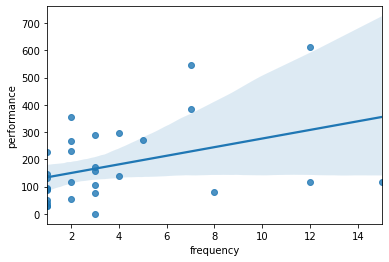

In [111]:
df_temp = df_check.dropna(axis = 0, how = 'any')
fig = sns.regplot(x='frequency', y = 'performance', data = df_temp)
plt.show()

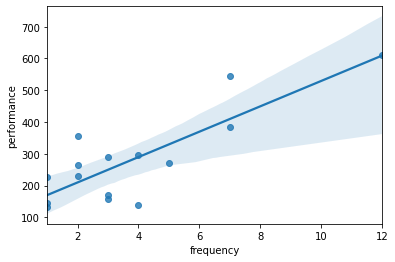

In [118]:
#if we consider only those having score above 150 are descently performing
fig2 = sns.regplot(x='frequency', y = 'performance', data = df_temp[df_temp['performance']>130])
plt.show()

In [119]:
url = 'https://drive.google.com/uc?export=download&id=1ZpWGm70S9jSpd6yn7zFXXK1a7yidMnOQ'
df_overall = pd.read_excel(url)
df_overall.head()

,Neighbourhood,Neighbourhood Id,POSTAL_CODE,TTC Stops,Road Kilometres,Road Volume,Total Major Crime Incidents,Vehicle Thefts,Businesses,Debt Risk Score,Home Prices,Local Employment,Cultural Location Index,Linguistic Diversity Index
0,West Humber-Clairville,1,M9W,338,165.007379,5956.638889,1119,288,2463,719,317508,58271,0.09,0.741343
1,Mount Olive-Silverstone-Jamestown,2,M9V,70,33.867318,3514.166667,690,62,271,687,251119,3244,0.13,0.815741
2,Thistletown-Beaumond Heights,3,M9V,45,27.876820,3545.000000,192,12,217,718,414216,1311,0.20,0.766720
3,Rexdale-Kipling,4,M9W,40,25.237129,7621.333333,164,18,144,721,392271,1178,0.07,0.660806
4,Elms-Old Rexdale,5,M9W,29,17.078211,4115.500000,185,22,67,692,233832,903,0.11,0.685554


In [ ]:
df_overall.index = df_overall['POSTAL_CODE']
df_temp.index = df_temp['postal_code']
df_temp2 = pd.merge(left=df_temp, left_index=True, right = df_overall.drop(['Neighbourhood','Neighbourhood Id'], axis =1), right_index = True, how = 'left')
df_temp2

In [121]:
df_temp2.columns

Index(['postal_code', 'borough', 'neighborhood', 'lat', 'lon', 'frequency',
       'score', 'sum', 'performance', 'POSTAL_CODE', 'TTC Stops',
       'Road Kilometres', 'Road Volume', 'Total Major Crime Incidents',
       'Vehicle Thefts', 'Businesses', 'Debt Risk Score', 'Home Prices',
       'Local Employment', 'Cultural Location Index',
       'Linguistic Diversity Index'],
      dtype='object')

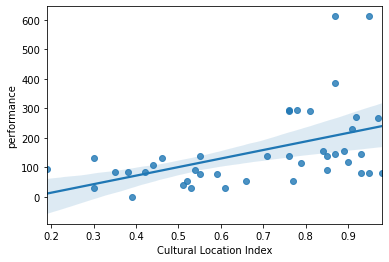

In [201]:
fig3 = sns.regplot(x = 'Cultural Location Index', y = 'performance',data = df_temp2)
plt.show()

In [379]:
from sklearn import linear_model
regr = linear_model.LinearRegression()
x = np.asanyarray(df_temp2[['frequency','Vehicle Thefts']])
y = np.asanyarray(df_temp2[['performance']])
x = np.nan_to_num(x)
y = np.nan_to_num(y)
#
#'frequency','Vehicle Thefts','Home Prices','Cultural Location Index','Linguistic Diversity Index'

In [380]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler() 
x = scaler.fit_transform(x)
y = scaler.fit_transform(y)

In [381]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.40, random_state=42)

In [382]:
regr.fit (x_train, y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [383]:
from sklearn.metrics import mean_squared_error, r2_score
y_hat= regr.predict(x_test)
print("Residual sum of squares: %.2f"
      % np.mean((y_hat - y_test) ** 2))

# Explained variance score: 1 is perfect prediction
print('Variance score: %.2f' % regr.score(x_test, y_test))
print('Coefficient of determination: %.2f'
      % r2_score(y_test, y_hat))

Residual sum of squares: 0.69
Variance score: 0.31
Coefficient of determination: 0.31


In [386]:
from sklearn import linear_model
regr = linear_model.LinearRegression()
df_temp3 = df_temp2.copy()
df_temp3 = df_temp3[df_temp3['Cultural Location Index']>0]
x = np.asanyarray(df_temp3['Cultural Location Index'])
y = np.asanyarray(df_temp3['performance'])
x = np.nan_to_num(x)
y = np.nan_to_num(y)

In [387]:
def func(x, a, c, d):
    return a*np.exp(c*x)+d

In [388]:
# Lets normalize our data
x=x/max(x)
y=y/max(y)

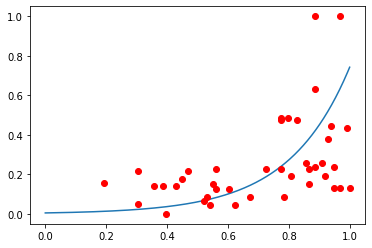

In [389]:
a = 0.005
b = 5
c = 0
#logistic function
Y_pred = func(np.linspace(0,1,1000), a , b, c)

#plot initial prediction against datapoints
plt.plot(np.linspace(0,1,1000), Y_pred)
plt.plot(x, y, 'ro')

In [390]:
from scipy.optimize import curve_fit
popt, pcov = curve_fit(func, x, y)
#print the final parameters
print(popt)

[ 0.08568624  1.71565463 -0.0517896 ]


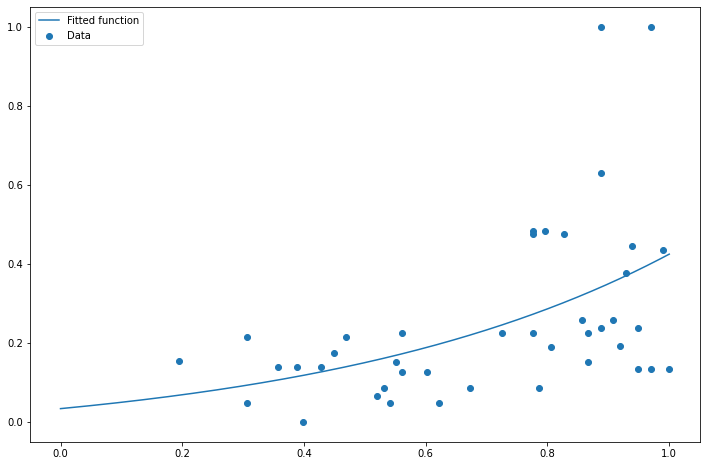

In [391]:
plt.figure(figsize=(12, 8))
plt.scatter(x, y, label='Data')
plt.plot(np.linspace(0,1,1000), func(np.linspace(0,1,1000), *popt),
         label='Fitted function')

plt.legend(loc='best')

plt.show()

In [392]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.30, random_state=12)

popt, pcov = curve_fit(func, x_train,y_train)
print(popt)
y_hat = func(x_test,*popt)

print('MAE: %.2f' % np.mean(np.absolute(y_hat - y_test)))
print('MSE: %.2f' % np.mean((y_hat - y_test)**2))
from sklearn.metrics import r2_score
print('R2 score: %.2f' % r2_score(y_hat,y_test))

[0.05832631 1.77419456 0.01599426]
MAE: 0.19
MSE: 0.08
R2 score: -12.87


In [401]:
df_temp3.to_excel('temp.xlsx')

In [ ]:
# one hot encoding
toronto_onehot_v2 = pd.get_dummies(toronto_venues_test[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
toronto_onehot_v2['Neighborhood'] = toronto_venues_test['Neighborhood'] 

# move neighborhood column to the first column
fixed_columns = [toronto_onehot_v2.columns[-1]] + list(toronto_onehot_v2.columns[:-1])
toronto_onehot_v2 = toronto_onehot_v2[fixed_columns]

toronto_onehot_v2.head()

,Women's Store,Airport,Airport Gate,Airport Lounge,Airport Service,Airport Terminal,Antique Shop,Aquarium,Art Gallery,Arts & Crafts Store,Auto Workshop,Baby Store,Bagel Shop,Bakery,Bank,Bar,Beach,Bed & Breakfast,Beer Store,Bistro,Boat or Ferry,Bookstore,Boutique,Brewery,Building,Bus Line,Butcher,Café,Camera Store,Candy Store,Cheese Shop,Chocolate Shop,Church,Clothing Store,Club,College Arts Building,College Auditorium,College Rec Center,Comic Shop,Concert Hall,Convenience Store,Convention Center,Cosmetics Shop,Coworking Space,Creperie,Cupcake Shop,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Discount Store,Distribution Center,Dog Run,Donut Shop,Electronics Store,Event Space,Farmers Market,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food & Drink Shop,Food Place,Food Truck,Fountain,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,General Entertainment,General Travel,Gift Shop,Gourmet Shop,Grocery Store,Harbor / Marina,Health & Beauty Service,Health Food Store,Historic Site,Hobby Shop,Hospital,Hotel,IT Services,Ice Cream Shop,Intersection,Jewelry Store,Lake,Light Rail Station,Lingerie Store,Liquor Store,Lounge,Market,Martial Arts Dojo,Men's Store,Metro Station,Miscellaneous Shop,Monument / Landmark,Museum,Music Venue,Neighborhood,Noodle House,Office,Opera House,Optical Shop,Organic Grocery,Other Great Outdoors,Park,Performing Arts Venue,Pet Store,Pharmacy,Plane,Plaza,Post Office,Pub,Record Shop,Rental Car Location,Restaurant,Roof Deck,Scenic Lookout,Sculpture Garden,Shoe Store,Shopping Mall,Skating Rink,Smoke Shop,Smoothie Shop,Spa,Speakeasy,Sporting Goods Shop,Sports Place,Stationery Store,Steakhouse,Supermarket,Swim School,Tailor Shop,Tanning Salon,Tea,Theater,Toy / Game Store,Trail,Train Station,Video Game Store,Wine Shop
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,The Beaches\n,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,The Beaches\n,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,The Beaches\n,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,The Beaches\n,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,"The Danforth West, Riverdale\n",0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [ ]:
toronto_onehot_v2.shape

(1638, 145)

In [ ]:

toronto_grouped_v2 = toronto_onehot_v2.groupby('Neighborhood').mean().reset_index()
toronto_grouped_v2

,Neighborhood,Women's Store,Airport,Airport Gate,Airport Lounge,Airport Service,Airport Terminal,Antique Shop,Aquarium,Art Gallery,Arts & Crafts Store,Auto Workshop,Baby Store,Bagel Shop,Bakery,Bank,Bar,Beach,Bed & Breakfast,Beer Store,Bistro,Boat or Ferry,Bookstore,Boutique,Brewery,Building,Bus Line,Butcher,Café,Camera Store,Candy Store,Cheese Shop,Chocolate Shop,Church,Clothing Store,Club,College Arts Building,College Auditorium,College Rec Center,Comic Shop,Concert Hall,Convenience Store,Convention Center,Cosmetics Shop,Coworking Space,Creperie,Cupcake Shop,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Discount Store,Distribution Center,Dog Run,Donut Shop,Electronics Store,Event Space,Farmers Market,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food & Drink Shop,Food Place,Food Truck,Fountain,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,General Entertainment,General Travel,Gift Shop,Gourmet Shop,Grocery Store,Harbor / Marina,Health & Beauty Service,Health Food Store,Historic Site,Hobby Shop,Hospital,Hotel,IT Services,Ice Cream Shop,Intersection,Jewelry Store,Lake,Light Rail Station,Lingerie Store,Liquor Store,Lounge,Market,Martial Arts Dojo,Men's Store,Metro Station,Miscellaneous Shop,Monument / Landmark,Museum,Music Venue,Noodle House,Office,Opera House,Optical Shop,Organic Grocery,Other Great Outdoors,Park,Performing Arts Venue,Pet Store,Pharmacy,Plane,Plaza,Post Office,Pub,Record Shop,Rental Car Location,Restaurant,Roof Deck,Scenic Lookout,Sculpture Garden,Shoe Store,Shopping Mall,Skating Rink,Smoke Shop,Smoothie Shop,Spa,Speakeasy,Sporting Goods Shop,Sports Place,Stationery Store,Steakhouse,Supermarket,Swim School,Tailor Shop,Tanning Salon,Tea,Theater,Toy / Game Store,Trail,Train Station,Video Game Store,Wine Shop
0,Berczy Park\n,0.00,0.0000,0.0000,0.000,0.0000,0.0000,0.000000,0.00,0.017241,0.000000,0.000000,0.000000,0.017241,0.034483,0.000000,0.068966,0.017241,0.000000,0.000000,0.017241,0.0000,0.000000,0.0000,0.000000,0.00,0.000000,0.000000,0.137931,0.000000,0.000000,0.034483,0.000000,0.000000,0.000000,0.034483,0.000000,0.000000,0.00,0.000000,0.017241,0.000000,0.00,0.000000,0.00000,0.017241,0.000000,0.000000,0.000000,0.017241,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.034483,0.000000,0.017241,0.00,0.000000,0.000000,0.051724,0.000000,0.017241,0.00000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.017241,0.017241,0.0000,0.000000,0.000000,0.000000,0.000000,0.000000,0.017241,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.017241,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.017241,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.00,0.017241,0.000000,0.000000,0.017241,0.0000,0.000000,0.000000,0.000000,0.000000,0.0000,0.241379,0.00,0.00,0.000000,0.000000,0.017241,0.00,0.000000,0.000000,0.000000,0.00,0.000000,0.034483,0.00000,0.017241,0.000000,0.000000,0.017241,0.00,0.000000,0.000000,0.000000,0.00000,0.00,0.000000,0.000000
1,"Brockton, Parkdale Village, Exhibition Place\n",0.00,0.0000,0.0000,0.000,0.0000,0.0000,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.045455,0.000000,0.045455,0.000000,0.000000,0.000000,0.000000,0.0000,0.000000,0.0000,0.000000,0.00,0.000000,0.000000,0.227273,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.045455,0.000000,0.000000,0.00,0.000000,0.000000,0.045455,0.00,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.136364,0.000000,0.000000,0.00000,0.00000,0.045455,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.045455,0.0000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.045455,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.00,

In [ ]:
toronto_grouped_v2.shape

(39, 145)

In [ ]:
toronto_grouped_mod = toronto_grouped_v2.copy()

In [ ]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

In [ ]:
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
neighborhoods_venues_sorted = pd.DataFrame(columns=columns)
neighborhoods_venues_sorted['Neighborhood'] = toronto_grouped_mod['Neighborhood']

for ind in np.arange(toronto_grouped_mod.shape[0]):
    neighborhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(toronto_grouped_mod.iloc[ind, :], num_top_venues)

neighborhoods_venues_sorted.head()

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Berczy Park\n,Restaurant,Café,Bar,Food Place,Bakery,Farmers Market,Club,Cheese Shop,Sports Place,Shopping Mall
1,"Brockton, Parkdale Village, Exhibition Place\n",Café,Food Place,Sports Place,Restaurant,Furniture / Home Store,Grocery Store,Bar,Bakery,Pet Store,Intersection
2,"Business reply mail Processing Centre, South C...",Restaurant,Sports Place,Light Rail Station,Food Place,Park,Brewery,Butcher,Spa,Farmers Market,Garden
3,"CN Tower, King and Spadina, Railway Lands, Har...",Airport Service,Airport Lounge,Boat or Ferry,Rental Car Location,Sculpture Garden,Café,Plane,Harbor / Marina,Food Place,Airport Terminal
4,Central Bay Street\n,Restaurant,Café,Food Place,Bar,Dessert Shop,Sports Place,Tea,Department Store,Hotel,Miscellaneous Shop


In [ ]:
neighborhoods_venues_sorted.shape

(39, 11)

In [ ]:
neighborhoods_venues_sorted.index = neighborhoods_venues_sorted['Neighborhood']
neighborhoods_venues_sorted.head()

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
Neighborhood,,,,,,,,,,,
Berczy Park\n,Berczy Park\n,Restaurant,Café,Bar,Food Place,Bakery,Farmers Market,Club,Cheese Shop,Sports Place,Shopping Mall
"Brockton, Parkdale Village, Exhibition Place\n","Brockton, Parkdale Village, Exhibition Place\n",Café,Food Place,Sports Place,Restaurant,Furniture / Home Store,Grocery Store,Bar,Bakery,Pet Store,Intersection
"Business reply mail Processing Centre, South Central Letter Processing Plant Toronto\n","Business reply mail Processing Centre, South C...",Restaurant,Sports Place,Light Rail Station,Food Place,Park,Brewery,Butcher,Spa,Farmers Market,Garden
"CN Tower, King and Spadina, Railway Lands, Harbourfront West, Bathurst Quay, South Niagara, Island airport\n","CN Tower, King and Spadina, Railway Lands, Har...",Airport Service,Airport Lounge,Boat or Ferry,Rental Car Location,Sculpture Garden,Café,Plane,Harbor / Marina,Food Place,Airport Terminal
Central Bay Street\n,Central Bay Street\n,Restaurant,Café,Food Place,Bar,Dessert Shop,Sports Place,Tea,Department Store,Hotel,Miscellaneous Shop


In [ ]:
neighborhoods_venues_sorted_merged = pd.merge(left=neighborhoods_venues_sorted, left_index=True, right=df_stat_perform, right_index=True, how='outer')
neighborhoods_venues_sorted_merged.head()

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,score,sum,performance
Neighborhood,,,,,,,,,,,,,,
Berczy Park\n,Berczy Park\n,Restaurant,Café,Bar,Food Place,Bakery,Farmers Market,Club,Cheese Shop,Sports Place,Shopping Mall,14.0,3665.6,261.828571
"Brockton, Parkdale Village, Exhibition Place\n","Brockton, Parkdale Village, Exhibition Place\n",Café,Food Place,Sports Place,Restaurant,Furniture / Home Store,Grocery Store,Bar,Bakery,Pet Store,Intersection,2.0,162.9,81.450000
"Business reply mail Processing Centre, South Central Letter Processing Plant Toronto\n","Business reply mail Processing Centre, South C...",Restaurant,Sports Place,Light Rail Station,Food Place,Park,Brewery,Butcher,Spa,Farmers Market,Garden,2.0,89.3,44.650000
"CN Tower, King and Spadina, Railway Lands, Harbourfront West, Bathurst Quay, South Niagara, Island airport\n","CN Tower, King and Spadina, Railway Lands, Har...",Airport Service,Airport Lounge,Boat or Ferry,Rental Car Location,Sculpture Garden,Café,Plane,Harbor / Marina,Food Place,Airport Terminal,NaN,NaN,NaN
Central Bay Street\n,Central Bay Street\n,Restaurant,Café,Food Place,Bar,Dessert Shop,Sports Place,Tea,Department Store,Hotel,Miscellaneous Shop,17.0,4472.8,263.105882


In [ ]:
neighborhoods_venues_sorted_merged.tail()

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,score,sum,performance
Neighborhood,,,,,,,,,,,,,,
"The Annex, North Midtown, Yorkville\n","The Annex, North Midtown, Yorkville\n",Food Place,Café,Restaurant,Pub,Museum,Liquor Store,Park,Pharmacy,Donut Shop,Wine Shop,3.0,476.7,158.900000
The Beaches\n,The Beaches\n,Pub,Trail,Health Food Store,Wine Shop,Dessert Shop,Department Store,Deli / Bodega,Dance Studio,Cupcake Shop,Creperie,NaN,NaN,NaN
"The Danforth West, Riverdale\n","The Danforth West, Riverdale\n",Restaurant,Café,Furniture / Home Store,Ice Cream Shop,Frozen Yogurt Shop,Sports Place,Pub,Dessert Shop,Brewery,Bar,16.0,2663.8,166.487500
"Toronto Dominion Centre, Design Exchange\n","Toronto Dominion Centre, Design Exchange\n",Restaurant,Café,Food Place,Hotel,Bar,Sports Place,Deli / Bodega,Concert Hall,Pub,Sporting Goods Shop,24.0,4815.1,200.629167
"University of Toronto, Harbord\n","University of Toronto, Harbord\n",Restaurant,Café,Bar,Sports Place,Bookstore,Food Place,Bakery,Pub,Beer Store,Bank,9.0,1049.5,116.611111


In [ ]:
neighborhoods_venues_sorted_merged.sort_values(['performance'], ascending=False, inplace = True)

In [ ]:
#neighborhoods_venues_sorted_merged.shape
neighborhoods_venues_sorted_merged.index = range(0,neighborhoods_venues_sorted_merged.shape[0])

In [ ]:
neighborhoods_venues_sorted_merged

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,score,sum,performance
0,"Regent Park, Harbourfront\n",Café,Bakery,Pub,Park,Restaurant,Food Place,Theater,Sports Place,Health Food Store,Historic Site,3.0,1819.4,606.466667
1,"Garden District, Ryerson\n",Restaurant,Café,Clothing Store,Food Place,Tea,Bar,Cosmetics Shop,Hotel,Sports Place,Bookstore,21.0,10738.2,511.342857
2,"Richmond, Adelaide, King\n",Restaurant,Café,Food Place,Sports Place,Hotel,Bar,Clothing Store,Steakhouse,Office,Bookstore,23.0,8784.6,381.939130
3,St. James Town\n,Restaurant,Café,Food Place,Bar,Clothing Store,Cosmetics Shop,Park,Creperie,Farmers Market,Sports Place,23.0,7745.6,336.765217
4,"India Bazaar, The Beaches West\n",Food Place,Restaurant,Park,Ice Cream Shop,Theater,Food & Drink Shop,Pub,Brewery,Fish & Chips Shop,Steakhouse,4.0,1241.6,310.400000
5,"Commerce Court, Victoria Hotel\n",Restaurant,Café,Food Place,Bar,Hotel,Sports Place,Deli / Bodega,Gastropub,Bakery,Fountain,30.0,8035.2,267.840000
6,Central Bay Street\n,Restaurant,Café,Food Place,Bar,Dessert Shop,Sports Place,Tea,Department Store,Hotel,Miscellaneous Shop,17.0,4472.8,263.105882
7,Berczy Park\n,Restaurant,Café,Bar,Food Place,Bakery,Farmers Market,Club,Cheese Shop,Sports Place,Shopping Mall,14.0,3665.6,261.828571
8,"First Canadian Place, Underground city\n",Restaurant,Café,Food Place,Bar,Hotel,Sports Place,Steakhouse,Deli / Bodega,Gastropub,Concert Hall,30.0,7806.2,260.206667
9,"Little Portugal, Trinity\n",Restaurant,Bar,Café,Men's Store,Food Place,Bistro,Bakery,Park,Cupcake Shop,Deli / Bodega,16.0,4096.6,256.037500


In [ ]:
toronto_grouped_v2_temp = toronto_grouped_v2.copy()

In [ ]:
toronto_grouped_v2_temp.index = toronto_grouped_v2_temp['Neighborhood']

In [ ]:
toronto_grouped_v2_lr = pd.merge(left=toronto_grouped_v2_temp, left_index=True, right=df_stat_perform, right_index=True, how='outer')
toronto_grouped_v2_lr

,Neighborhood,Women's Store,Airport,Airport Gate,Airport Lounge,Airport Service,Airport Terminal,Antique Shop,Aquarium,Art Gallery,Arts & Crafts Store,Auto Workshop,Baby Store,Bagel Shop,Bakery,Bank,Bar,Beach,Bed & Breakfast,Beer Store,Bistro,Boat or Ferry,Bookstore,Boutique,Brewery,Building,Bus Line,Butcher,Café,Camera Store,Candy Store,Cheese Shop,Chocolate Shop,Church,Clothing Store,Club,College Arts Building,College Auditorium,College Rec Center,Comic Shop,Concert Hall,Convenience Store,Convention Center,Cosmetics Shop,Coworking Space,Creperie,Cupcake Shop,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Discount Store,Distribution Center,Dog Run,Donut Shop,Electronics Store,Event Space,Farmers Market,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food & Drink Shop,Food Place,Food Truck,Fountain,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,General Entertainment,General Travel,Gift Shop,Gourmet Shop,Grocery Store,Harbor / Marina,Health & Beauty Service,Health Food Store,Historic Site,Hobby Shop,Hospital,Hotel,IT Services,Ice Cream Shop,Intersection,Jewelry Store,Lake,Light Rail Station,Lingerie Store,Liquor Store,Lounge,Market,Martial Arts Dojo,Men's Store,Metro Station,Miscellaneous Shop,Monument / Landmark,Museum,Music Venue,Noodle House,Office,Opera House,Optical Shop,Organic Grocery,Other Great Outdoors,Park,Performing Arts Venue,Pet Store,Pharmacy,Plane,Plaza,Post Office,Pub,Record Shop,Rental Car Location,Restaurant,Roof Deck,Scenic Lookout,Sculpture Garden,Shoe Store,Shopping Mall,Skating Rink,Smoke Shop,Smoothie Shop,Spa,Speakeasy,Sporting Goods Shop,Sports Place,Stationery Store,Steakhouse,Supermarket,Swim School,Tailor Shop,Tanning Salon,Tea,Theater,Toy / Game Store,Trail,Train Station,Video Game Store,Wine Shop,score,sum,performance
Neighborhood,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Berczy Park\n,Berczy Park\n,0.00,0.0000,0.0000,0.000,0.0000,0.0000,0.000000,0.00,0.017241,0.000000,0.000000,0.000000,0.017241,0.034483,0.000000,0.068966,0.017241,0.000000,0.000000,0.017241,0.0000,0.000000,0.0000,0.000000,0.00,0.000000,0.000000,0.137931,0.000000,0.000000,0.034483,0.000000,0.000000,0.000000,0.034483,0.000000,0.000000,0.00,0.000000,0.017241,0.000000,0.00,0.000000,0.00000,0.017241,0.000000,0.000000,0.000000,0.017241,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.034483,0.000000,0.017241,0.00,0.000000,0.000000,0.051724,0.000000,0.017241,0.00000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.017241,0.017241,0.0000,0.000000,0.000000,0.000000,0.000000,0.000000,0.017241,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.017241,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.017241,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.00,0.017241,0.000000,0.000000,0.017241,0.0000,0.000000,0.000000,0.000000,0.000000,0.0000,0.241379,0.00,0.00,0.000000,0.000000,0.017241,0.00,0.000000,0.000000,0.000000,0.00,0.000000,0.034483,0.00000,0.017241,0.000000,0.000000,0.017241,0.00,0.000000,0.000000,0.000000,0.00000,0.00,0.000000,0.000000,14.0,3665.6,261.828571
"Brockton, Parkdale Village, Exhibition Place\n","Brockton, Parkdale Village, Exhibition Place\n",0.00,0.0000,0.0000,0.000,0.0000,0.0000,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.045455,0.000000,0.045455,0.000000,0.000000,0.000000,0.000000,0.0000,0.000000,0.0000,0.000000,0.00,0.000000,0.000000,0.227273,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.045455,0.000000,0.000000,0.00,0.000000,0.000000,0.045455,0.00,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.136364,0.000000,0.000000,0.00000,0.00000,0.045455,0.000000,0.000000,0.000000,0.000000,0.000000,0.000

In [ ]:
toronto_grouped_v2_lr.index = range(0,toronto_grouped_v2_lr.shape[0])
toronto_grouped_v2_lr.sort_values(['performance'],ascending = False, inplace = True)

In [ ]:
toronto_grouped_v2_lr.index = range(0,toronto_grouped_v2_lr.shape[0])

In [ ]:
toronto_grouped_v2_lr.fillna(0)

,Neighborhood,Women's Store,Airport,Airport Gate,Airport Lounge,Airport Service,Airport Terminal,Antique Shop,Aquarium,Art Gallery,Arts & Crafts Store,Auto Workshop,Baby Store,Bagel Shop,Bakery,Bank,Bar,Beach,Bed & Breakfast,Beer Store,Bistro,Boat or Ferry,Bookstore,Boutique,Brewery,Building,Bus Line,Butcher,Café,Camera Store,Candy Store,Cheese Shop,Chocolate Shop,Church,Clothing Store,Club,College Arts Building,College Auditorium,College Rec Center,Comic Shop,Concert Hall,Convenience Store,Convention Center,Cosmetics Shop,Coworking Space,Creperie,Cupcake Shop,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Discount Store,Distribution Center,Dog Run,Donut Shop,Electronics Store,Event Space,Farmers Market,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food & Drink Shop,Food Place,Food Truck,Fountain,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,General Entertainment,General Travel,Gift Shop,Gourmet Shop,Grocery Store,Harbor / Marina,Health & Beauty Service,Health Food Store,Historic Site,Hobby Shop,Hospital,Hotel,IT Services,Ice Cream Shop,Intersection,Jewelry Store,Lake,Light Rail Station,Lingerie Store,Liquor Store,Lounge,Market,Martial Arts Dojo,Men's Store,Metro Station,Miscellaneous Shop,Monument / Landmark,Museum,Music Venue,Noodle House,Office,Opera House,Optical Shop,Organic Grocery,Other Great Outdoors,Park,Performing Arts Venue,Pet Store,Pharmacy,Plane,Plaza,Post Office,Pub,Record Shop,Rental Car Location,Restaurant,Roof Deck,Scenic Lookout,Sculpture Garden,Shoe Store,Shopping Mall,Skating Rink,Smoke Shop,Smoothie Shop,Spa,Speakeasy,Sporting Goods Shop,Sports Place,Stationery Store,Steakhouse,Supermarket,Swim School,Tailor Shop,Tanning Salon,Tea,Theater,Toy / Game Store,Trail,Train Station,Video Game Store,Wine Shop,score,sum,performance
0,"Regent Park, Harbourfront\n",0.00,0.0000,0.0000,0.000,0.0000,0.0000,0.022222,0.00,0.022222,0.000000,0.000000,0.000000,0.000000,0.066667,0.022222,0.000000,0.000000,0.000000,0.022222,0.000000,0.0000,0.000000,0.0000,0.000000,0.00,0.000000,0.000000,0.200000,0.000000,0.000000,0.000000,0.022222,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.00,0.022222,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.022222,0.000000,0.022222,0.000000,0.000000,0.022222,0.022222,0.022222,0.000000,0.000000,0.00,0.000000,0.000000,0.044444,0.000000,0.000000,0.00000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.0000,0.000000,0.022222,0.022222,0.000000,0.000000,0.000000,0.000000,0.022222,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.00,0.066667,0.022222,0.000000,0.000000,0.0000,0.000000,0.000000,0.066667,0.000000,0.0000,0.066667,0.00,0.00,0.000000,0.022222,0.000000,0.00,0.000000,0.000000,0.022222,0.00,0.000000,0.044444,0.00000,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.044444,0.000000,0.00000,0.00,0.000000,0.022222,3.0,1819.4,606.466667
1,"Garden District, Ryerson\n",0.00,0.0000,0.0000,0.000,0.0000,0.0000,0.000000,0.00,0.010000,0.000000,0.000000,0.000000,0.000000,0.010000,0.010000,0.030000,0.000000,0.000000,0.000000,0.000000,0.0000,0.020000,0.0000,0.000000,0.00,0.000000,0.000000,0.130000,0.000000,0.000000,0.000000,0.000000,0.000000,0.100000,0.000000,0.000000,0.000000,0.01,0.010000,0.000000,0.000000,0.00,0.030000,0.00000,0.000000,0.000000,0.000000,0.000000,0.010000,0.010000,0.000000,0.000000,0.000000,0.000000,0.020000,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.080000,0.000000,0.000000,0.00000,0.00000,0.010000,0.000000,0.000000,0.000000,0.000000,0.010000,0.000000,0.00,0.000000,0.000000,0.000000,0.0000,0.000000,0.000000,0.000000,0.000000,0.000000,0.020000,0.000000,0.010000,0.000000,0.000000,0.01,0.000000,0.020000,0.000000,0.010000,0.000000,0.000000,0.000000,0.000000,0.010000,0.00,0

In [ ]:
from sklearn import linear_model
regr = linear_model.LinearRegression()
x = np.asanyarray(toronto_grouped_v2_lr.drop(['Neighborhood','sum','score'],axis = 1))
y = np.asanyarray(toronto_grouped_v2_lr[['performance']])
x = np.nan_to_num(x)
y = np.nan_to_num(y)

In [ ]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.10, random_state=42)

In [ ]:
regr.fit (x_train, y_train)
# The coefficients
print ('Coefficients: ', regr.coef_)

Coefficients:  [[ 7.45237023e-06 -1.95157314e-06 -1.95157314e-06 -3.90314628e-06
  -5.85471941e-06 -1.95157314e-06  1.09099171e-06 -1.66531894e-05
   2.27529146e-05 -2.67797662e-06 -2.81154164e-06  3.82801265e-06
   1.30315578e-07  2.03357738e-05 -3.92817781e-06 -9.85934003e-06
   3.01327471e-06  4.41539231e-06  6.36385331e-06  1.93795011e-06
  -1.95157314e-06 -1.55465247e-05 -1.95157314e-06 -1.95963929e-05
   7.45237023e-06 -4.99964789e-06 -4.46915005e-06  4.16727407e-06
   2.67709089e-06  3.82801265e-06 -6.67080580e-06  1.24395905e-05
  -7.56789613e-06  4.01928798e-06 -4.30247210e-06 -1.15642473e-05
   5.17958290e-06  8.85315039e-06  5.94367030e-06  3.59095168e-06
  -1.33772273e-05 -3.33063789e-06  1.68381528e-05 -1.97695527e-06
  -2.06938043e-06  1.45984888e-05 -9.84593183e-06  1.31784535e-06
   5.34430898e-06 -1.55124755e-06 -7.20927896e-06  1.11038794e-05
   6.48410550e-06  8.77155611e-06  2.87982668e-05  1.65613228e-05
   7.26139769e-06 -1.14770856e-05 -2.11618438e-06 -3.78070262

In [ ]:
y_hat= regr.predict(x_test)
print("Residual sum of squares: %.2f"
      % np.mean((y_hat - y_test) ** 2))

# Explained variance score: 1 is perfect prediction
print('Variance score: %.2f' % regr.score(x_test, y_test))

Residual sum of squares: 0.00
Variance score: 1.00


In [ ]:
from sklearn.cluster import DBSCAN
import sklearn.utils
from sklearn.preprocessing import StandardScaler
sklearn.utils.check_random_state(1000)


In [ ]:
toronto_grouped_mod

In [ ]:
Clus_dataSet = toronto_grouped_mod.drop(['Neighborhood','Clus_Db'],axis = 1)
Clus_dataSet = np.nan_to_num(Clus_dataSet)
Clus_dataSet = StandardScaler().fit_transform(Clus_dataSet)

In [ ]:
import numpy as np
from sklearn.datasets.samples_generator import make_blobs
from sklearn.neighbors import NearestNeighbors
from sklearn.cluster import DBSCAN
from matplotlib import pyplot as plt
import seaborn as sns
sns.set()

In [ ]:
neigh = NearestNeighbors(n_neighbors=2)
nbrs = neigh.fit(Clus_dataSet)
distances, indices = nbrs.kneighbors(Clus_dataSet)

In [ ]:
distances = np.sort(distances, axis=0)
distances = distances[:,1]
plt.plot(distances)

In [ ]:
for i in range(1,25):
  for j in range(3,10):
    # Compute DBSCAN
    db = DBSCAN(eps=i, min_samples=j).fit(Clus_dataSet)
    core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
    core_samples_mask[db.core_sample_indices_] = True
    labels = db.labels_
    toronto_grouped_mod["Clus_Db"]=labels

    realClusterNum=len(set(labels)) - (1 if -1 in labels else 0)
    clusterNum = len(set(labels)) 
    print(i,j,set(labels))

# A sample of clusters
#toronto_grouped_mod[['Neighborhood',"Clus_Db"]].head(5)

In [ ]:
cost =[] 
for i in range(5, 10): 
    KM = KMeans(n_clusters = i, max_iter = 500) 
    KM.fit(Clus_dataSet) 
      
    # calculates squared error 
    # for the clustered points 
    cost.append(KM.inertia_)      
  
# plot the cost against K values 
plt.plot(range(5, 10), cost, color ='g', linewidth ='3') 
plt.xlabel("Value of K") 
plt.ylabel("Sqaured Error (Cost)") 
plt.show() # clear the plot 
  
# the point of the elbow is the  
# most optimal value for choosing k 

In [ ]:
toronto_venues.groupby('Venue Category').count()